# Part 3 Preprocessing and Machine Learning

In [61]:
from utils import *

In [2]:
# Read in the data
tweet_stocks = pd.read_pickle('data/tweet_stocks_EDA.pkl')

# Data Preprocessing

To get the text ready for machine learning, we will remove punctuation, stopwords, junkwords, and normalize the text by making it lowercase and lemmatizing it.

To extract features from the text, we are going to first clean it of any links, mentions, hashtags, and emojis to preserve the syntax of the tweet. We will be looking at two examples during this process.

We have two tweets from Elon Musk that made headlines for how they affected the stock. August 7th, 2018 caused stocks to jump and May 1st, 2020. Let't take a look at these tweets.

In [3]:
# Sample Text
sample = tweet_stocks[tweet_stocks['username'] == 'elonmusk']
sample['date'] = pd.to_datetime(sample['date'])
sample.set_index('date', inplace=True)

pd.options.display.max_colwidth = 1000
sample_increase = sample['2018-08-07']
sample_decrease = sample['2020-05-01']
sample_tweet_increase = sample_increase[['tweet', 'percent change']]
sample_tweet_decrease = sample_decrease[['tweet' ,'percent change']].reset_index().drop(0).set_index('date')
pct_increase = sample_tweet_increase['percent change'].values*100
pct_decrease = sample_tweet_decrease['percent change'].values*100
print('Tweet Increases Stock by {:.3f}%'.format(pct_increase[0]))
print('========================')
print(sample_tweet_increase[['tweet']].values[0][0], '\n')
print('Tweet Decreases Stock by {:.3f}%'.format(pct_decrease[0]))
print('========================')
print(sample_tweet_decrease[['tweet']].values[0][0])

Tweet Increases Stock by 10.391%
Investor support is confirmed. Only reason why this is not certain is that it’s contingent on a shareholder vote. @MindFieldMusic Def no forced sales. Hope all shareholders remain. Will be way smoother &amp; less disruptive as a private company. Ends negative propaganda from shorts. @thatspacegeek Yes, but liquidity events would be limited to every 6 months or so (like SpaceX) Shareholders could either to sell at 420 or hold shares &amp; go private @heydave7 Absolutely. Am super appreciative of Tesla shareholders. Will ensure their prosperity in any scenario. @Gfilche My hope is *all* current investors remain with Tesla even if we’re private. Would create special purpose fund enabling anyone to stay with Tesla. Already do this with Fidelity’s SpaceX investment. @EvotoRentals Yes @FredericLambert I don’t have a controlling vote now &amp; wouldn’t expect any shareholder to have one if we go private. I won’t be selling in either scenario. Good morning 😀 @L

Both twitter samples need to be cleaned, which needs to be able to conserve the context around the text.

In [4]:
tweet_stocks['text'] = tweet_stocks['tweet'].apply(lambda x: clean_text(x, preserve_syntax=True))

In [5]:
sample = tweet_stocks[tweet_stocks['username'] == 'elonmusk']
sample['date'] = pd.to_datetime(sample['date'])
sample.set_index('date', inplace=True)

sample_increase = sample['2018-08-07']
sample_decrease = sample['2020-05-01']
sample_tweet_increase = sample_increase[['text', 'percent change']]
sample_tweet_decrease = sample_decrease[['text' ,'percent change']].reset_index().drop(0).set_index('date')
pct_increase = sample_tweet_increase['percent change'].values*100
pct_decrease = sample_tweet_decrease['percent change'].values*100
print('Cleaned Tweet Increases Stock by {:.3f}%'.format(pct_increase[0]))
print('========================')
print(sample_tweet_increase[['text']].values[0][0], '\n')
print('Cleaned Tweet Decreases Stock by {:.3f}%'.format(pct_decrease[0]))
print('========================')
print(sample_tweet_decrease[['text']].values[0][0])

Cleaned Tweet Increases Stock by 10.391%
Investor support is confirmed. Only reason why this is not certain is that it is contingent on a shareholder vote. Def no forced sales. Hope all shareholders remain. Will be way smoother less disruptive as a private company. Ends negative propaganda from shorts. Yes, but liquidity events would be limited to every 6 months or so like SpaceX Shareholders could either to sell at 420 or hold shares go private Absolutely. Am super appreciative of Tesla shareholders. Will ensure their prosperity in any scenario. My hope is all current investors remain with Tesla even if we are private. Would create special purpose fund enabling anyone to stay with Tesla. Already do this with Fidelitys SpaceX investment. Yes I do not have a controlling vote now would not expect any shareholder to have one if we go private. I will not be selling in either scenario. Good morning 420 Am considering taking Tesla private at 420. Funding secured. 

Cleaned Tweet Decreases St

Apart from a few sentences lacking punctuation, the text itself is preserved including capitalization, which will aid in using Spacy's NLP toolkit to extract text features.

### Extracting Text Features

In [6]:
tweet_stocks['number of emojis'] = tweet_stocks['tweet'].apply(lambda x: emoji_counts(x))

In [7]:
nlp = spacy.load('en_core_web_lg')

In [8]:
# Remove empty tweets after cleaning

tweet_stocks['tweet length'] = tweet_stocks['text'].apply(lambda x: len(x))
tweet_stocks = tweet_stocks[tweet_stocks['tweet length'] != 0]
tweet_stocks.reset_index(inplace=True, drop=True)

In [9]:
%%time
# This take ~10 min
extract_text_features(tweet_stocks['text'])

CPU times: user 4.03 ms, sys: 205 µs, total: 4.23 ms
Wall time: 4.14 ms


In [10]:
%%time
# Clocked at 14min 20s
df = tweet_stocks.copy(deep=True)
text  = 'text'

df['number of sentences'] = df[text].apply(lambda x: num_sentences(x))
df['number of words'] = df[text].apply(lambda x: num_words(x))
df['avg words per sentence'] = df[text].apply(lambda x: avg_words_per_sentence(x))

count = df[text].apply(lambda x: noun_counts(x))
df['number of nouns'] = 0
for i in range(len(count)):
    df['number of nouns'].iloc[i] = count[i][0]

count = df[text].apply(lambda x: verb_counts(x))
df['number of verbs'] = 0
for i in range(len(count)):
    df['number of verbs'].iloc[i] = count[i][0]

count = df[text].apply(lambda x: stopword_counts(x))
df['number of stopwords'] = 0
for i in range(len(count)):
    df['number of stopwords'].iloc[i] = count[i][0]

count = df[text].apply(lambda x: org_counts(x))
df['number of organizations'] = 0
for i in range(len(count)):
    df['number of organizations'].iloc[i] = count[i][0]

CPU times: user 10min 53s, sys: 46.5 s, total: 11min 40s
Wall time: 11min 58s


In [11]:
tweet_stocks = df

In [12]:
print(nlp.Defaults.stop_words)

{'much', 'per', 'along', 'seems', 'anything', 'towards', 'really', 'into', 'take', 'down', 'whose', 'nobody', 'unless', 'above', 'due', 'across', 'up', 'too', 'within', 'three', 'about', 'regarding', 'sometimes', 'nor', 'hence', 'any', 'us', 'whereafter', 'move', 'go', 'hers', 'herself', 'everyone', 'only', 'mostly', 'next', 'cannot', 'each', 'if', 'him', 'latterly', 'than', 'perhaps', 'her', 'be', 'sometime', 'ours', 'before', 'of', 'either', 'then', 'until', 'herein', 'thereafter', 'an', 'never', 'enough', 'except', 'whereas', 'therein', 'upon', 'nowhere', 'itself', 'last', 'was', 'sixty', 'out', 'hereupon', 'and', 'against', 'myself', 'nevertheless', 'also', 'bottom', 'somewhere', 'afterwards', 'indeed', 'someone', 'when', 'beforehand', 'anyway', 'once', 'yourselves', 'formerly', 'third', 'well', 'under', 'whether', 'in', 'empty', 'he', 'one', 'quite', '’ve', 'may', 'are', 'me', 'thus', 'put', 'give', 'side', 'does', 'name', 'what', 'could', 'can', 'six', "'ll", 'our', 'keep', 'must

In [13]:
# Will add or remove to this list as needed

not_stop_words_list = ["too", "not", "below", "under", "over", "up", "down", "move"]
for word in not_stop_words_list:
    nlp.Defaults.stop_words.remove(word)

In [14]:
STOP_WORDS = nlp.Defaults.stop_words

In [15]:
sample_increase['text']

date
2018-08-07 16:00:00    Investor support is confirmed. Only reason why this is not certain is that it is contingent on a shareholder vote. Def no forced sales. Hope all shareholders remain. Will be way smoother less disruptive as a private company. Ends negative propaganda from shorts. Yes, but liquidity events would be limited to every 6 months or so like SpaceX Shareholders could either to sell at 420 or hold shares go private Absolutely. Am super appreciative of Tesla shareholders. Will ensure their prosperity in any scenario. My hope is all current investors remain with Tesla even if we are private. Would create special purpose fund enabling anyone to stay with Tesla. Already do this with Fidelitys SpaceX investment. Yes I do not have a controlling vote now would not expect any shareholder to have one if we go private. I will not be selling in either scenario. Good morning 420 Am considering taking Tesla private at 420. Funding secured.
Name: text, dtype: object

In [16]:
sample_increase['text'].apply(lambda x: extract_key_sentences(x, 'tesla'))

date
2018-08-07 16:00:00    am super appreciative of tesla shareholders. my hope is all current investors remain with tesla even if we are private. would create special purpose fund enabling anyone to stay with tesla. good morning 420 am considering taking tesla private at 420. funding secured.
Name: text, dtype: object

In [17]:
sample_increase['cleaned'] = sample_increase['tweet'].apply(lambda x: clean_text(x, stop_words=STOP_WORDS))
sample_decrease['cleaned'] = sample_decrease['tweet'].apply(lambda x: clean_text(x, stop_words=STOP_WORDS))

In [18]:
sample_increase[['cleaned']]

,cleaned
date,
2018-08-07 16:00:00,investor support confirm reason not certain contingent shareholder vote def force sale hope shareholder remain way smoother disruptive private company end negative propaganda short yes liquidity event limited month like spacex shareholder sell hold share private absolutely super appreciative tesla shareholder ensure prosperity scenario hope current investor remain tesla private create special purpose fund enable stay tesla fidelitys spacex investment yes not control vote not expect shareholder private not sell scenario good morning consider take tesla private funding secure


In [19]:
sample_decrease[['cleaned']]

,cleaned
date,
2020-05-01 09:30:00,got exactly say need stop
2020-05-01 16:00:00,baby monday not need cash devote mars earth possession weigh down gf mad stipulation sale gene wilders old house tear down lose soul rage rage die light consciousness exactly cheaply freedom sell over land free home brave oh starspangled banner wave give proof night flag rocket red glare bomb burst air people freedom tesla stock price too high go sell physical possession house incentive matter starship make good progress real


We can see from the cleaned text that there are going to be some words that won't be recognized. Let's look at all short words and see if they can be removed.

In [20]:
%%time
# Clocked at 3min 26s
tweet_stocks['cleaned'] = tweet_stocks['text'].apply(lambda x:clean_text(x, stop_words=STOP_WORDS))

CPU times: user 2min 7s, sys: 2.94 s, total: 2min 10s
Wall time: 2min 11s


In [21]:
all_text = " ".join(tweet_stocks['cleaned'])
orig_len = len(all_text)
small_words = [word for word in all_text.split() if len(word) <= 2]
small_words = set(small_words)

In [22]:
print(small_words)

{'ab', 'he', 'sa', 'pr', 'th', 'sc', 'og', 'dq', 'mo', 'ld', 'vx', 'wo', 'zx', 'io', 'ts', 'kr', 'gb', 'db', 'ub', 'vz', 'ue', 'me', 'na', 'ux', 'ac', 'ns', 'nc', 'dp', 'ox', 'bt', 'tm', 'xr', 'nz', 'qa', 'ku', 'le', 'rc', 'bn', 'co', 'gm', 'lz', 'nd', 'vp', 've', 'we', 'wm', 'de', 'ph', 'mk', 'rv', 'mt', 'bg', 'ge', 'dd', 'ms', 'aw', 'ma', 'ir', 'ha', 'bj', 'lv', 'cn', 'hd', 'up', 'bf', 'ae', 'jd', 'gf', 'hp', 'ty', 'hi', 'dm', 'va', 'lp', 'gt', 'fr', 'ak', 'ga', 'ag', 'da', 'ad', 'af', 'cj', 'uv', 'ja', 'df', 'nl', 'oz', 'ya', 'hb', 'sp', 'vs', 'bo', 'om', 'mw', 'ew', 'kw', 'ok', 'sk', 'cr', 'ah', 'cb', 'cd', 'un', 'sm', 'lt', 'vc', 'ai', 'go', 'xx', 'jo', 'ce', 'jp', 'gs', 'ho', 'fb', 'jk', 'vm', 'cc', 'uk', 'uc', 'ft', 'cs', 'mc', 'kn', 'la', 'dr', 'fl', 'tw', 'xl', 'mn', 'dj', 'el', 'ed', 'ct', 'se', 'wa', 'mi', 'fm', 'fa', 'hh', 'tx', 'wh', 'um', 'op', 'ps', 'dg', 'ba', 'hm', 'iv', 'tv', 'bu', 'pi', 'vw', 'kc', 'eu', 'ch', 'pp', 'sw', 'di', 'pj', 'bk', 'vf', 'yo', 'lm', 'cm', 'eo

Let's remove these

In [23]:
sample_decrease['cleaned'] = sample_decrease['cleaned'].apply(lambda x:" ".join([x for x in x.split() if x not in small_words]))

In [24]:
sample_decrease[['cleaned']]

,cleaned
date,
2020-05-01 09:30:00,got exactly say need stop
2020-05-01 16:00:00,baby monday not need cash devote mars earth possession weigh down mad stipulation sale gene wilders old house tear down lose soul rage rage die light consciousness exactly cheaply freedom sell over land free home brave starspangled banner wave give proof night flag rocket red glare bomb burst air people freedom tesla stock price too high sell physical possession house incentive matter starship make good progress real


This looks like it works. Let's apply it over the whole dataframe.

In [25]:
tweet_stocks['cleaned'] = tweet_stocks['cleaned'].apply(lambda x:" ".join([x for x in x.split() if x not in small_words]))

Let's now look at infrequent words to see if we can remove any of them.

In [26]:
freq_words = pd.Series(all_text.split()).value_counts()
rare_words = freq_words[freq_words.values == 1]

In [27]:
print(rare_words)

clubso               1
oceangot             1
stuffas              1
otherstoday          1
tothrille            1
                    ..
cooperative          1
leadershipveteran    1
joyously             1
ethnicity            1
quesarito            1
Length: 14514, dtype: int64


A lot of these are misspellings and can be safely removed. 

In [28]:
tweet_stocks['cleaned'] = tweet_stocks['cleaned'].apply(lambda x:" ".join([x for x in x.split() if x not in rare_words]))

In [29]:
all_text = " ".join(tweet_stocks['cleaned'])
cleaned_len = len(all_text)

In [30]:
print('Original Text Length: {}'.format(orig_len))
print('Cleaned Text Length: {}'.format(cleaned_len))
print('Cleaned / Original: {:.2f}'.format(cleaned_len / orig_len))

Original Text Length: 2293261
Cleaned Text Length: 2126658
Cleaned / Original: 0.93


# Separate Training, Test, and Holdout Sets

1. Pick Username
2. Show Distribution of Target Variable
3. Select Features (Text and Non-Text)
4. Scale the Data
5. Dimension Reduction
6. Split into Training/Testing
7. Separate Holdout from Training
8. Perform cross validation
9. Look at Results
10. Tune Hyperparameters
11. Run Test Data
12. Interpretability

In [31]:
numerical_feat = [
    'mentions', 'hashtags', 'cashtags',
       'video', 'photos', 'urls', 'replies_count', 'retweets_count',
       'likes_count', 'number of tweets',
       'number of emojis', 'tweet length', 'number of sentences',
       'number of words', 'avg words per sentence', 'number of nouns',
       'number of verbs', 'number of stopwords', 'number of organizations',
       ]
original_features = numerical_feat
text_feat = ['tweet', 'text', 'cleaned']
targets = []
all_scores = {}
cv_scores = {}
models = {}

In [32]:
# Make Different Binning Types
bin_name = 'change/no change'
tweet_stocks[bin_name] = 'change'
tweet_stocks[bin_name][tweet_stocks['bins'] == 'no change'] = 'no change'
targets.append(bin_name)

In [33]:
pd.to_pickle(tweet_stocks, './data/pre_processed_df.pkl')

In [34]:
full_df = tweet_stocks.copy(deep=True)
df_training, df_testing = train_test_split(full_df, test_size=0.3)


# Choosing a metric

We could look at this problem in one of two ways: if an investor were to use this machine learning approach to evaluate investment opportunites from twitter data, assuming predicting stock price increases are the positive label and drops are negative, a risky investor would prioritize correctly predicting rising stocks to minimize opportunity loss. This would be a reason to look at recall scores for model metrics as it provides an indication of missed positive predictions. 

>Recall = TP / (TP + FN)

Other metrics like F1 and the ROC-AUC score are also appropriate as it incorporates loss mitigation as a factor (both are indicators of how to optimize both precision and recall).

Sensitivity-Specificity Metrics
Sensitivity refers to the true positive rate and summarizes how well the positive class was predicted.

**Sensitivity** = TruePositive / (TruePositive + FalseNegative)

In binary classifiers, the recall of the positive class label is the sensitivity, and the recall of the negative is the specificity. 

Unlike precision that only comments on the correct positive predictions out of all positive predictions, recall provides an indication of missed positive predictions.
For imbalanced learning, recall is typically used to measure the coverage of the minority class.

**Specificity** = TrueNegative / (FalsePositive + TrueNegative)
For imbalanced classification, the sensitivity might be more interesting than the specificity.

Sensitivity and Specificity can be combined into a single score that balances both concerns, called the geometric mean or G-Mean.

**G-Mean** = sqrt(Sensitivity * Specificity)

In [35]:
save = pd.read_pickle('./data/pre_processed_df.pkl')

In [36]:
tweet_stocks = save

# Separate Data into Training/Testing and put Testing Aside

### Change / No Change
In this scenario, an investor is using social media to see if there are going to be stocks worth watching, so machine learning will be used predict if there is an sufficient change in stock price as determined by a set threshold. Because the data are likely to be imbalanced, the harmonic mean of the precision (measure of stocks correctly identified as changing out of all stocks that did change), and the recall (out of all the stocks that did change, how many were correctly identified as changing).

In [37]:
df = df_training.copy(deep=True)
numerical_feat = original_features.copy()
text_name = 'cleaned'
col_name = 'change/no change'
labels = list(df[col_name].unique())
target_name = 'classification'

df[target_name] = 0
df[target_name][df[col_name] == labels[1]] = 1

Value Counts:
classification
0                 6562
1                 1511
dtype: int64


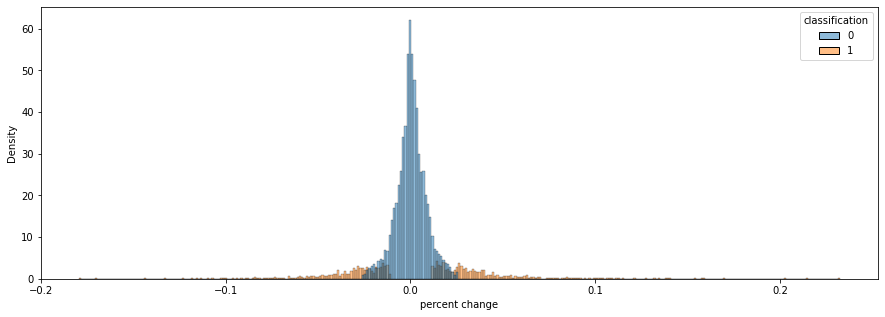

count    8073.000000
mean        0.000885
std         0.019858
min        -0.179500
25%        -0.005390
50%         0.000391
75%         0.006830
max         0.232461
Name: percent change, dtype: float64


In [38]:
# Define user, target, feature names
print('Value Counts:')
print(df[[target_name]].value_counts())
plt.figure(figsize=[15,5])
_ = sns.histplot(data = df, x='percent change', hue=target_name, stat='density')
plt.show()
print(df['percent change'].describe())

This dataset is imbalanced. The positive class (change) makes up only ~18% of data. As we are looking to see if Twitter data can predict that stocks will rise of fall within a certain percentage

In [39]:
%%time
# Clocked at 10min 40s
len_1 = len(df[df[target_name] == 0])
len_2 = len(df[df[target_name] == 1])
class_weight = {0:1, 1:(len_1/len_2)}

print('class 0 size: {:.3f}'.format(len_1))
print('class 1 size: {:.3f}'.format(len_2))
print('class weights: ', class_weight)

svm = SVC(probability = True, class_weight=class_weight)
lgr = LogisticRegression(n_jobs=-1, class_weight=class_weight)
nb = MultinomialNB()
#clf_list = [svm, lgr, nb]
clf_list = [nb, lgr]
scores = cross_validation_scores(df, target_name, numerical_feat, text_name, clf_list)

class 0 size: 6562.000
class 1 size: 1511.000
class weights:  {0: 1, 1: 4.342819324950364}
CPU times: user 17.6 s, sys: 3.07 s, total: 20.7 s
Wall time: 54.1 s


In [40]:
cv_key =  "cv_1"
scores['n_features'] = len(numerical_feat)
cv_scores[cv_key] = scores
all_scores[col_name] = cv_scores

In [41]:
all_scores[col_name][cv_key].sort_values(by='test_f1_mean', ascending=False)[:3]

,username,model,fit_time_mean,fit_time_std,score_time_mean,score_time_std,test_balanced_accuracy_mean,test_balanced_accuracy_std,test_precision_mean,test_precision_std,test_recall_mean,test_recall_std,test_f1_mean,test_f1_std,test_roc_auc_mean,test_roc_auc_std,n_samples,n_pos_label,n_features
9,richardbranson,"LogisticRegression(class_weight={0: 1, 1: 4.342819324950364}, n_jobs=-1)",1.509216,0.168676,0.075313,0.007400,0.666051,0.039397,0.400115,0.099736,0.447863,0.091043,0.413192,0.063098,0.789054,0.046849,980,134,19
7,JohnLegere,"LogisticRegression(class_weight={0: 1, 1: 4.342819324950364}, n_jobs=-1)",2.835782,0.091058,0.081189,0.009800,0.536930,0.018063,0.257548,0.025038,0.331287,0.022006,0.289595,0.023090,0.570751,0.051329,1626,344,19
5,Benioff,"LogisticRegression(class_weight={0: 1, 1: 4.342819324950364}, n_jobs=-1)",1.178510,0.227763,0.070253,0.005924,0.534108,0.044432,0.256969,0.072966,0.247778,0.069734,0.252035,0.070674,0.581114,0.051718,891,178,19


The top scorer were all from the gradient descent classifier. Because the data are imbalanced, we can add a class_weight to the classifier to see if the results are any better. We will do the same to the Logistic Regression as it typically performs better than gradient descent.

This is a big improvement. Logistic Regression has a better mean F1 and smaller std than the Stochastic Gradient Descent with the weighted scores. However the average fit time is rougly 7x longer. This isn't a problem now, but it will be an issue when we look at hypertuning the parameters. We will look to reducing the data to aid in this.

richardbranson
Test_f1_mean: 0.413
Test_f1_std: 0.063
Range of test_f1_mean: 0.350 -- 0.476
LogisticRegression(class_weight={0: 1, 1: 4.342819324950364}, n_jobs=-1)
The mean cross-validation accuracy is: 0.811 +/- 0.017
Precision: 0.397
Recall: 0.544
Balanced accuracy: 0.707
              precision    recall  f1-score   support

           0       0.92      0.87      0.90       364
           1       0.40      0.54      0.46        57

    accuracy                           0.83       421
   macro avg       0.66      0.71      0.68       421
weighted avg       0.85      0.83      0.84       421



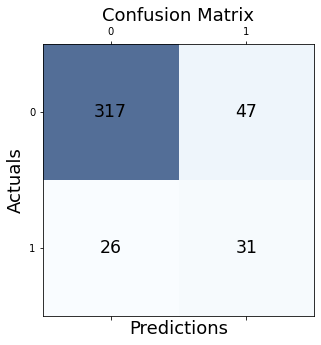

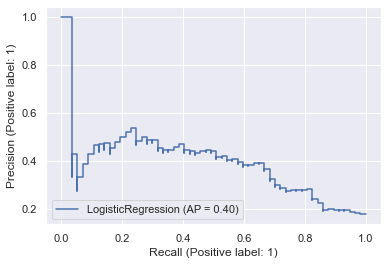

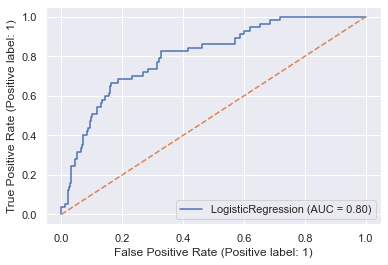

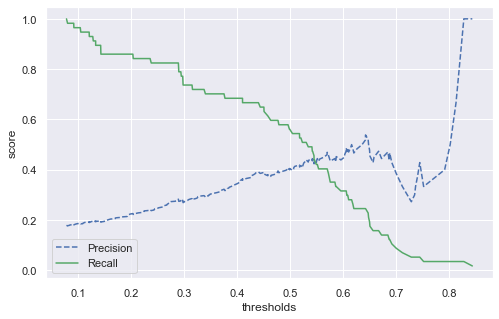

In [42]:
scorer = 'test_f1'
_ = examine_model(df, all_scores[col_name][cv_key], scorer, target_name, numerical_feat, pos=0, reduce=False)

We will look to reduce the dimensions through PCA, TruncatedSVD, and feature selection. 

In [46]:
user = all_scores[col_name][cv_key].sort_values(by='test_f1_mean', ascending=False).reset_index(drop=True)['username'][0]
clf = all_scores[col_name][cv_key].sort_values(by='test_f1_mean', ascending=False).reset_index(drop=True)['model'][0]
df = df[df['username'] == user].copy(deep=True)
X, y = make_xy(df, target_name, numerical_feat, text_name)

In [47]:
%%time
# Clocked at 3min 20s
grid={
    "C":np.logspace(-3,3,7), "penalty":["l1","l2"], "dual":[False, True],
    "solver" : ['liblinear', 'saga']
} 

len_1 = len(df[df['classification'] == 0])
len_2 = len(df[df['classification'] == 1])
class_weight = {0:1, 1:(len_1/len_2)}

# Separate into Training/Testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, stratify=y)
scoring = 'f1'
clf = LogisticRegression(n_jobs=-1, class_weight=class_weight)
clf_cv=GridSearchCV(clf,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)

tuned hyperparameters :(best parameters)  {'C': 1.0, 'dual': False, 'penalty': 'l2', 'solver': 'saga'}
best score : 0.4071963538577406
CPU times: user 1min, sys: 5.98 s, total: 1min 6s
Wall time: 2min 23s


In [51]:
model_key =  col_name + '_clf_1'
key = "clf_cv_1"

# Save Results
models[model_key] = clf_cv

lgr_params = pd.DataFrame(clf_cv.cv_results_)
lgr_params['username'] = user
lgr_params['scoring'] = scoring
lgr_params['n_class_0'] = len_1
lgr_params['n_class_1'] = len_2

cv_scores[key] = lgr_params

all_scores[col_name] = cv_scores

The mean cross-validation accuracy is: 0.793 +/- 0.007
Precision: 0.381
Recall: 0.561
Balanced accuracy: 0.709
              precision    recall  f1-score   support

           0       0.93      0.86      0.89       364
           1       0.38      0.56      0.45        57

    accuracy                           0.82       421
   macro avg       0.65      0.71      0.67       421
weighted avg       0.85      0.82      0.83       421



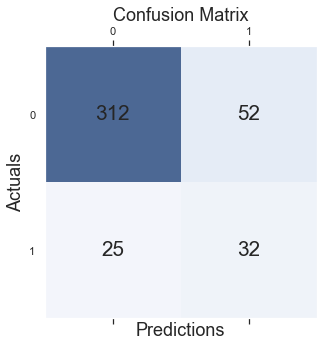

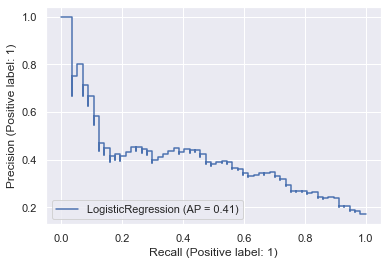

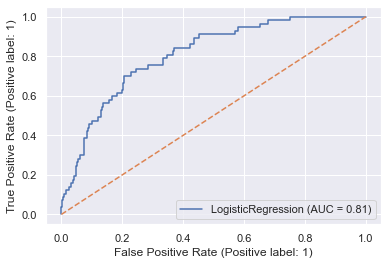

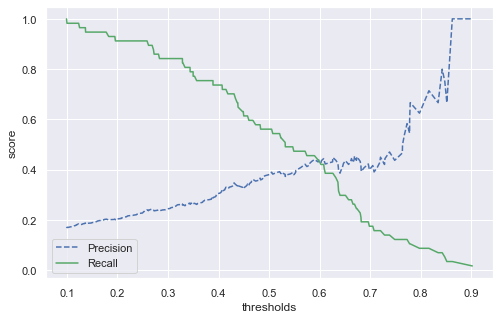

In [52]:
clf = models[model_key].best_estimator_
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
full_report(clf, X_train, X_test, y_train, y_test)
y_proba = clf.predict_proba(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

# Business-Case Testing and Modeling
In our scenario, an investor would want to see stock changes as quickly as possible, so the twitter features number of replies, retweets, and likes should be discarded as a prediction of new stock price changes on trained on historical data wouldn't have nearly as many counts in those features, and thus aren't a good representation of a real-world application.

In [53]:
numerical_feat = ['mentions',
 'hashtags',
 'cashtags',
 'video',
 'photos',
 'urls',
 'number of tweets',
 'number of emojis',
 'tweet length',
 'number of sentences',
 'number of words',
 'avg words per sentence',
 'number of nouns',
 'number of verbs',
 'number of stopwords',
 'number of organizations']

df = df_training.copy(deep=True)

text_name = 'cleaned'
col_name = 'change/no change'
labels = list(df[col_name].unique())
target_name = 'classification'

df[target_name] = 0
df[target_name][df[col_name] == labels[1]] = 1

In [54]:
%%time
# Clocked in at 8min 20s
len_1 = len(df[df['classification'] == 0])
len_2 = len(df[df['classification'] == 1])
class_weight = {0:1, 1:(len_1/len_2)}

print('class 0 size: {:.3f}'.format(len_1))
print('class 1 size: {:.3f}'.format(len_2))
print('class weights: ', class_weight)

svm = SVC(probability=True, class_weight=class_weight)
lgr = LogisticRegression(n_jobs=-1, class_weight=class_weight)
nb = MultinomialNB()
clf_list = [svm, lgr, nb]

scores = cross_validation_scores(df, target_name, numerical_feat, text_name, clf_list)

class 0 size: 6562.000
class 1 size: 1511.000
class weights:  {0: 1, 1: 4.342819324950364}
CPU times: user 6min 12s, sys: 11.3 s, total: 6min 23s
Wall time: 7min 12s


In [55]:
cv_key =  "cv_3"
scores['n_features'] = len(numerical_feat)
cv_scores[cv_key] = scores
all_scores[col_name] = cv_scores

In [56]:
all_scores[col_name][cv_key].sort_values(by='test_f1_mean', ascending=False)[:5]

,username,model,fit_time_mean,fit_time_std,score_time_mean,score_time_std,test_balanced_accuracy_mean,test_balanced_accuracy_std,test_precision_mean,test_precision_std,test_recall_mean,test_recall_std,test_f1_mean,test_f1_std,test_roc_auc_mean,test_roc_auc_std,n_samples,n_pos_label,n_features
13,richardbranson,"LogisticRegression(class_weight={0: 1, 1: 4.342819324950364}, n_jobs=-1)",1.395636,0.081100,0.071509,0.001031,0.638170,0.011354,0.354872,0.061105,0.395726,0.035533,0.369573,0.021206,0.789810,0.024137,980,134,16
10,JohnLegere,"LogisticRegression(class_weight={0: 1, 1: 4.342819324950364}, n_jobs=-1)",2.300169,0.329391,0.078350,0.000967,0.548413,0.017134,0.267691,0.024614,0.369054,0.034816,0.309693,0.023489,0.575908,0.027106,1626,344,16
7,Benioff,"LogisticRegression(class_weight={0: 1, 1: 4.342819324950364}, n_jobs=-1)",1.007889,0.122930,0.065974,0.001002,0.521361,0.029124,0.233764,0.044035,0.241905,0.044563,0.237281,0.043054,0.561488,0.030017,891,178,16
1,elonmusk,"LogisticRegression(class_weight={0: 1, 1: 4.342819324950364}, n_jobs=-1)",2.262330,0.604456,0.132959,0.056592,0.511043,0.049316,0.210651,0.073299,0.223256,0.108582,0.215352,0.089613,0.521896,0.032974,1070,215,16
16,levie,"LogisticRegression(class_weight={0: 1, 1: 4.342819324950364}, n_jobs=-1)",0.385003,0.192410,0.041217,0.001734,0.493916,0.036837,0.203929,0.105087,0.144444,0.049690,0.164003,0.058819,0.475406,0.055595,448,90,16


This is promising. Let's optimize the model again.

In [57]:
user = all_scores[col_name][cv_key].sort_values(by='test_f1_mean', ascending=False).reset_index(drop=True)['username'][0]
clf = all_scores[col_name][cv_key].sort_values(by='test_f1_mean', ascending=False).reset_index(drop=True)['model'][0]
df = df[df['username'] == user].copy(deep=True)
X, y = make_xy(
    df,
    target_name,
    numerical_feat,
    text_name,
    min_df=1,
    ngram_range=(1, 1),
    decomp=False,
)

In [58]:
%%time
# Clocked at 3min 20s
grid={
    "C":np.logspace(-3,3,7), "penalty":["l1","l2"], "dual":[False, True],
    "solver" : ['liblinear', 'saga']
} 

len_1 = len(df[df['classification'] == 0])
len_2 = len(df[df['classification'] == 1])
class_weight = {0:1, 1:(len_1/len_2)}

# Separate into Training/Testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, stratify=y)
scoring = 'f1'
clf = LogisticRegression(n_jobs=-1, class_weight=class_weight)
clf_cv=GridSearchCV(lgr,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)

tuned hyperparameters :(best parameters)  {'C': 0.1, 'dual': False, 'penalty': 'l2', 'solver': 'saga'}
best score : 0.4212809152282837
CPU times: user 1min 4s, sys: 5.89 s, total: 1min 10s
Wall time: 3min 4s


In [59]:
model_key =  col_name + '_clf_2'
key = "clf_cv_2"

# Save Results
models[model_key] = clf_cv

lgr_params = pd.DataFrame(clf_cv.cv_results_)
lgr_params['username'] = user
lgr_params['scoring'] = scoring
lgr_params['n_class_0'] = len_1
lgr_params['n_class_1'] = len_2

cv_scores[key] = lgr_params

all_scores[col_name] = cv_scores

The mean cross-validation accuracy is: 0.792 +/- 0.027
Precision: 0.330
Recall: 0.544
Balanced accuracy: 0.685
              precision    recall  f1-score   support

           0       0.92      0.83      0.87       364
           1       0.33      0.54      0.41        57

    accuracy                           0.79       421
   macro avg       0.63      0.69      0.64       421
weighted avg       0.84      0.79      0.81       421



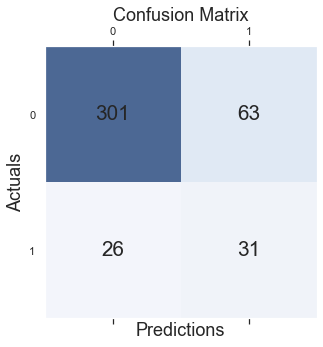

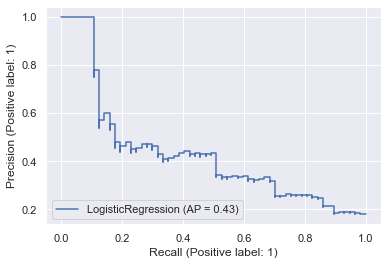

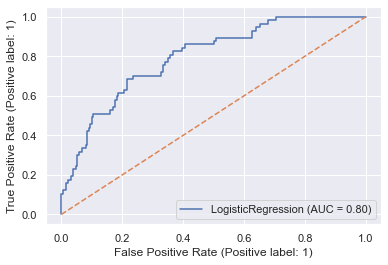

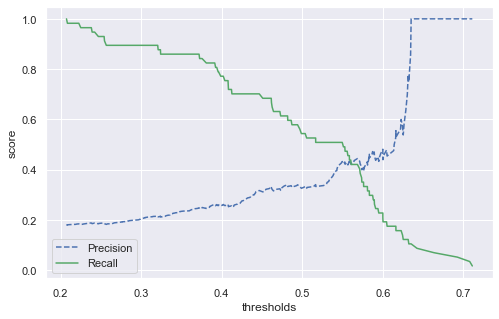

In [60]:
clf = models[model_key].best_estimator_
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
full_report(clf, X_train, X_test, y_train, y_test)
y_proba = clf.predict_proba(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

Treshold: 0.394


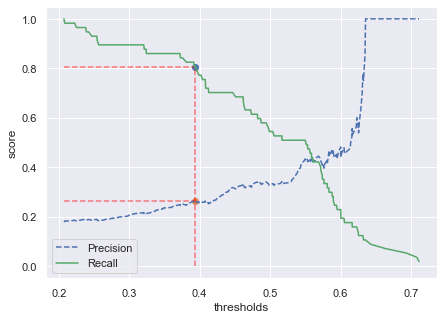

              precision    recall  f1-score   support

           0       0.96      0.64      0.77       364
           1       0.26      0.81      0.39        57

    accuracy                           0.67       421
   macro avg       0.61      0.72      0.58       421
weighted avg       0.86      0.67      0.72       421



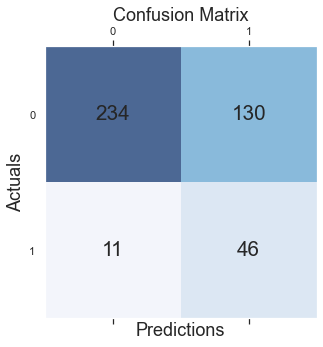

  Confusion Matrix Metrics
  How often is the classifier correct?
  Accuracy: 46.556%

  How often is it wrong?
  Error Rate: -45.556%

  When it's actually yes, how often does it predict yes?
  True Positive Rate (Recall): 80.702%

  When it predicts yes, how often is it correct?
  Precision: 26.136%

  When it's actually no, how often does it predict yes?
  False Positive Rate: 35.714%

  When it's actually no, how often does it predict no?
  True Negative Rate (Specificity): 64.286%
  F1 Score: 0.395
  Weighted F1 Score (beta = 2): 0.569
  G-mean: 0.459


In [62]:
thresh = plot_threshold(precisions, recalls, thresholds, clf, recall_thresh=0.8)

y_pred = (clf.predict_proba(X_test)[:,1] >= thresh).astype(int)
print(classification_report(y_test, y_pred))
plot_confusion_matrix(y_test, y_pred, show_metrics=True)

# Testing Model and Interpretability

In [63]:
case_study_feat = ['mentions',
 'hashtags',
 'cashtags',
 'video',
 'photos',
 'urls',
 'number of tweets',
 'number of emojis',
 'tweet length',
 'number of sentences',
 'number of words',
 'avg words per sentence',
 'number of nouns',
 'number of verbs',
 'number of stopwords',
 'number of organizations']

In [64]:
# Separate Training from Testing
train_data = df_training.copy(deep=True)
train_data = train_data[train_data['username']==user]
test_data = df_testing.copy(deep=True)
test_data = test_data[test_data['username']==user]
train_data.reset_index(inplace=True, drop=True)
train_idx = train_data.index
start = len(train_data)
stop = len(train_data)+len(test_data)
test_idx = np.arange(start, stop)
test_data.index = test_idx

numerical_feat = case_study_feat.copy()
target_name = 'classification'
text_name = 'cleaned'
col_name = 'change/no change' 
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]

train_data[target_name] = 0
train_data[target_name][train_data[col_name] == labels[1]] = 1


test_data[target_name] = 0
test_data[target_name][test_data[col_name] == labels[1]] = 1


df = pd.concat([train_data, test_data])


# Get bins and calculate class_weight on training data

len_1 = len(train_data[train_data['classification'] == 0])
len_2 = len(train_data[train_data['classification'] == 1])
class_weight = {0:1, 1:(len_1/len_2)}

In [67]:
%%time
# Clocked at 3min 20s
grid={
    "C":np.logspace(-3,3,7), "penalty":["l1","l2"], "dual":[False, True],
    "solver" : ['liblinear', 'saga']
} 

len_1 = len(df[df['classification'] == 0])
len_2 = len(df[df['classification'] == 1])
class_weight = {0:1, 1:(len_1/len_2)}


X, y = make_xy(df,
    target_name,
    numerical_feat,
    text_name
)

X_train = X.loc[train_idx]
X_test = X.loc[test_idx]
y_train = y.loc[train_idx]
y_test = y.loc[test_idx]

# Separate into Training/Testing
scoring = 'f1'
clf = LogisticRegression(n_jobs=-1, class_weight=class_weight)
clf_cv=GridSearchCV(lgr,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)

tuned hyperparameters :(best parameters)  {'C': 1.0, 'dual': False, 'penalty': 'l2', 'solver': 'liblinear'}
best score : 0.44491121402433675
CPU times: user 2min 32s, sys: 11.2 s, total: 2min 43s
Wall time: 5min 21s


In [68]:
model_key =  col_name + '_clf_test'
key = "clf_cv_test"

# Save Results
models[model_key] = clf_cv

lgr_params = pd.DataFrame(lgr_cv.cv_results_)
lgr_params['username'] = user
lgr_params['scoring'] = scoring
lgr_params['n_class_0'] = len_1
lgr_params['n_class_1'] = len_2

cv_scores[key] = lgr_params

all_scores[col_name] = cv_scores

richardbranson
LogisticRegression(class_weight={0: 1, 1: 6.909448818897638}, n_jobs=-1,
                   solver='liblinear')
The mean cross-validation accuracy is: 0.786 +/- 0.012
Precision: 0.248
Recall: 0.571
Balanced accuracy: 0.686
              precision    recall  f1-score   support

           0       0.94      0.80      0.87       545
           1       0.25      0.57      0.35        63

    accuracy                           0.78       608
   macro avg       0.59      0.69      0.61       608
weighted avg       0.87      0.78      0.81       608



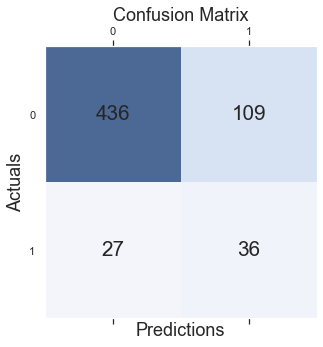

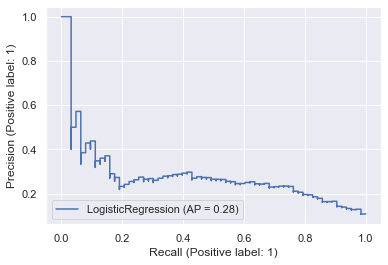

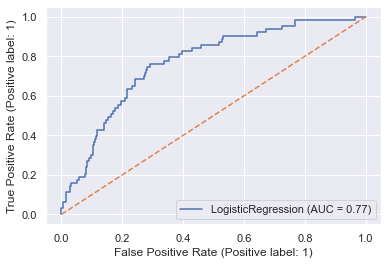

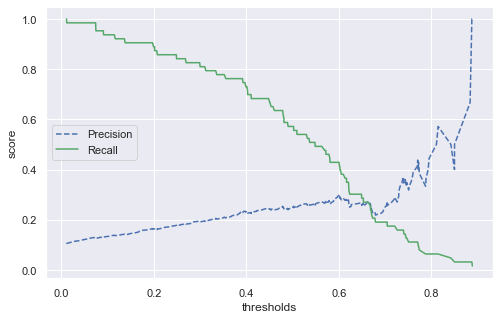

In [69]:
clf = models[model_key].best_estimator_
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
print(user)
print(clf)
full_report(clf, X_train, X_test, y_train, y_test)
y_proba = clf.predict_proba(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

Treshold: 0.310


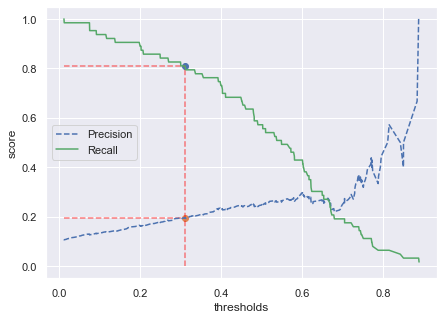

richardbranson
LogisticRegression(class_weight={0: 1, 1: 6.909448818897638}, n_jobs=-1,
                   solver='liblinear')
              precision    recall  f1-score   support

           0       0.97      0.61      0.75       545
           1       0.20      0.81      0.31        63

    accuracy                           0.63       608
   macro avg       0.58      0.71      0.53       608
weighted avg       0.89      0.63      0.71       608



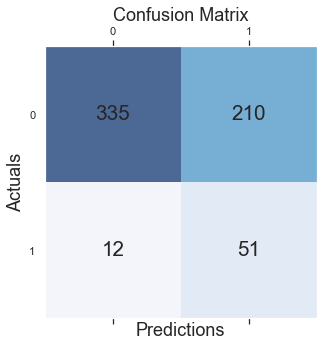

  Confusion Matrix Metrics
  How often is the classifier correct?
  Accuracy: 51.551%

  How often is it wrong?
  Error Rate: -50.551%

  When it's actually yes, how often does it predict yes?
  True Positive Rate (Recall): 80.952%

  When it predicts yes, how often is it correct?
  Precision: 19.540%

  When it's actually no, how often does it predict yes?
  False Positive Rate: 38.532%

  When it's actually no, how often does it predict no?
  True Negative Rate (Specificity): 61.468%
  F1 Score: 0.315
  Weighted F1 Score (beta = 2): 0.497
  G-mean: 0.398


In [70]:
# default threshold is 0.5
thresh = plot_threshold(precisions, recalls, thresholds, clf, recall_thresh=0.8)
print(user)
print(clf)
y_pred = (clf.predict_proba(X_test)[:,1] >= thresh).astype(int)
print(classification_report(y_test, y_pred))
plot_confusion_matrix(y_test, y_pred, show_metrics=True)

# Interpretation

In [71]:
most_predictive_words(clf, train_data['cleaned'], train_data[target_name], min_df=1)


 Most Predictive Words for bin: 0
     
             million 0.62
                come 0.62
                 not 0.63
             improve 0.63
                 sea 0.63
                luck 0.63
                have 0.64
                love 0.68
              change 0.74
               quote 0.87

 Most Predictive Words for bin: 1
     
             onboard 0.85
          productive 0.85
              active 0.86
            february 0.86
                 aha 0.86
              evolve 0.87
           encourage 0.87
             promise 0.88
              vision 0.89
             thought 0.89




In [72]:
target_word = 'vision'
i = get_index(test_data['cleaned'], target_word)
test_data['cleaned'].loc[i]

'launch vision wellbeing get fascinating insight expert prediction flexible work lifestyle medicine encourage wellbee workhow harness skill high demand try fit find good way healthy habit routine help people wellbee programme technology'

In [73]:
idx = i
class_names = ['no change', 'change']
interpret_instance(clf, train_data, test_data, class_names, idx, numerical_feat, 5)

Document id: 1464
Percent Change: 0.023
Probability(Change) = 0.200
True class: no change


In [74]:
classifications = pd.DataFrame()
classifications['actual'] = y_test.copy(deep=True)
classifications['y_pred'] = y_pred
classifications['y_proba_1'] = y_proba[:,1]
misclassifications = classifications[classifications['actual'] != classifications['y_pred']]
correct_classifications = classifications[classifications['actual'] == classifications['y_pred']]
print('Misclassified change as no change {} times'.format(len(misclassifications[misclassifications['actual'] == 1])))
print('Top 5 misclassifications')
misclassifications[misclassifications['actual'] == 1].sort_values(by='y_proba_1')[:5]

Misclassified change as no change 12 times
Top 5 misclassifications


,actual,y_pred,y_proba_1
1769,1,0,0.011199
1462,1,0,0.074250
1726,1,0,0.074626
1921,1,0,0.090890
1898,1,0,0.114604


In [75]:
idx = misclassifications[misclassifications['actual'] == 1].sort_values(by='y_proba_1').index[0]
class_names = ['no change', 'change']
interpret_instance(clf, train_data, test_data, class_names, idx, numerical_feat, 5)

Document id: 1769
Percent Change: -0.038
Probability(Change) = 0.114
True class: change


In [76]:
print('Misclassified no change as change {} times'.format(len(misclassifications[misclassifications['actual'] == 0])))
print('Top 5 misclassifications')
misclassifications[misclassifications['actual'] == 0].sort_values(by='y_proba_1', ascending=False)[:5]

Misclassified no change as change 210 times
Top 5 misclassifications


,actual,y_pred,y_proba_1
1579,0,1,0.883731
1997,0,1,0.850089
1600,0,1,0.850006
1471,0,1,0.810976
2006,0,1,0.795191


In [77]:
idx = misclassifications[misclassifications['actual'] == 0].sort_values(by='y_proba_1', ascending=False).index[0]
class_names = ['no change', 'change']
interpret_instance(clf, train_data, test_data, class_names, idx, numerical_feat, 5)

Document id: 1579
Percent Change: 0.000
Probability(Change) = 0.806
True class: no change


In [81]:
target_word = 'virgin'
i = get_index(test_data['cleaned'], target_word)
test_data['cleaned'].loc[i]

'incredibly exciting time hotel work thankfully open hotel great excuse share raymond great company make difference society environment wonderful holly present organic virgin unite impact award thank susan team excite bring special city congratulation winner wonderful company perfect example business positive difference finalist sure thrive exciting minute awfully long time onstage happen favourite thing support entrepreneur create thrive business real pleasure help judge winner plenty fun surprise edinburgh edinburgh fit fabric city create unique'

In [82]:
idx = i
class_names = ['no change', 'change']
interpret_instance(clf, train_data, test_data, class_names, idx, numerical_feat, 5)

Document id: 1408
Percent Change: -0.004
Probability(Change) = 0.360
True class: no change
